In [1]:
import os

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPool2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [3]:
datadir= 'Data Set'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data= pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names= columns)

In [4]:
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\anura\Desktop\BTP\Data Set\IMG\center...,C:\Users\anura\Desktop\BTP\Data Set\IMG\left_...,C:\Users\anura\Desktop\BTP\Data Set\IMG\right...,0.0,0.0,0,0.000079
1,C:\Users\anura\Desktop\BTP\Data Set\IMG\center...,C:\Users\anura\Desktop\BTP\Data Set\IMG\left_...,C:\Users\anura\Desktop\BTP\Data Set\IMG\right...,0.0,0.0,0,0.000078
2,C:\Users\anura\Desktop\BTP\Data Set\IMG\center...,C:\Users\anura\Desktop\BTP\Data Set\IMG\left_...,C:\Users\anura\Desktop\BTP\Data Set\IMG\right...,0.0,0.0,0,0.000079
3,C:\Users\anura\Desktop\BTP\Data Set\IMG\center...,C:\Users\anura\Desktop\BTP\Data Set\IMG\left_...,C:\Users\anura\Desktop\BTP\Data Set\IMG\right...,0.0,0.0,0,0.000078
4,C:\Users\anura\Desktop\BTP\Data Set\IMG\center...,C:\Users\anura\Desktop\BTP\Data Set\IMG\left_...,C:\Users\anura\Desktop\BTP\Data Set\IMG\right...,0.0,0.0,0,0.000078


In [5]:
def path_leaf(path):
    head, tail= ntpath.split(path)
    return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_11_18_15_27_08_703.jpg,left_2024_11_18_15_27_08_703.jpg,right_2024_11_18_15_27_08_703.jpg,0.0,0.0,0,0.000079
1,center_2024_11_18_15_27_08_804.jpg,left_2024_11_18_15_27_08_804.jpg,right_2024_11_18_15_27_08_804.jpg,0.0,0.0,0,0.000078
2,center_2024_11_18_15_27_08_926.jpg,left_2024_11_18_15_27_08_926.jpg,right_2024_11_18_15_27_08_926.jpg,0.0,0.0,0,0.000079
3,center_2024_11_18_15_27_09_050.jpg,left_2024_11_18_15_27_09_050.jpg,right_2024_11_18_15_27_09_050.jpg,0.0,0.0,0,0.000078
4,center_2024_11_18_15_27_09_168.jpg,left_2024_11_18_15_27_09_168.jpg,right_2024_11_18_15_27_09_168.jpg,0.0,0.0,0,0.000078


# Data Visualization

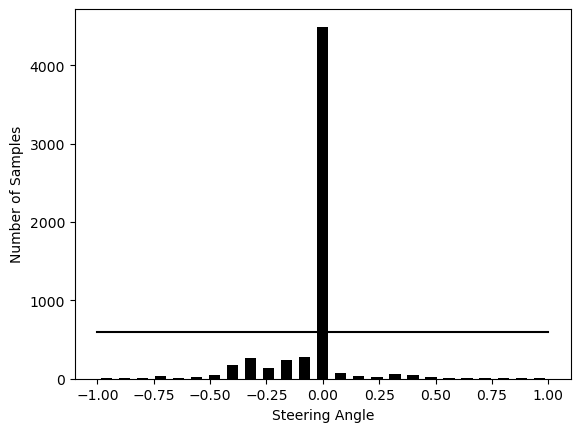

In [6]:
import numpy as np
import matplotlib.pyplot as plt

num_bins = 25
samples_per_bin = 600
# Assuming `data['steering']` contains the steering angle data
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5

plt.bar(center, hist, width=0.05, color='black')  # Bar graph with black color
plt.plot(
    (np.min(data['steering']), np.max(data['steering'])),
    (samples_per_bin, samples_per_bin),
    color='black'
)  # Line graph with black color

# Adding titles to axes
plt.xlabel('Steering Angle')  # X-axis title
plt.ylabel('Number of Samples')  # Y-axis title

plt.show()


In [7]:
print('total data:', len(data))
print (data.shape)

total data: 6029
(6029, 7)


In [8]:
remove_list= []
for j in range (num_bins):
    list_=[]
    for i in  range (len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_= shuffle(list_)
    list_= list_[samples_per_bin:]
    remove_list.extend(list_)

print('removed: ', len(remove_list))
data.drop(data.index[remove_list], inplace= True)
print('remaining: ', len(data))

removed:  3890
remaining:  2139


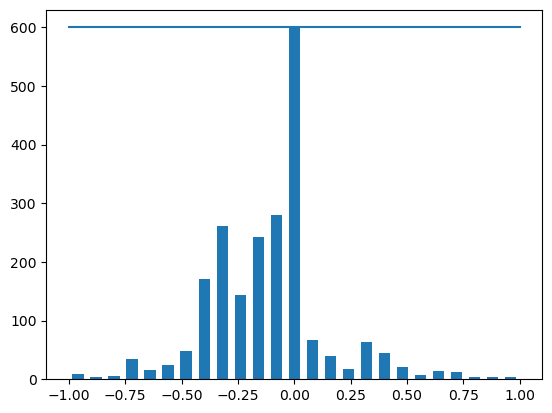

In [9]:
hist, _= np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width= 0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [10]:
def load_img_steering(datadir, df):
    image_path= []
    steering = []
    for i in range (len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        #center image append
        image_path.append(os.path. join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        #right image append
        image_path.append(os.path.join(datadir, right.strip()))
        steering.append(float(indexed_data[3])+0.15)
        #left image append
        image_path.append(os.path.join(datadir, left.strip()))
        steering.append(float(indexed_data[3])-0.15)
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

In [11]:
image_paths, steerings= load_img_steering(datadir + '/IMG', data)

C:\Users\anura\AppData\Local\Temp\ipykernel_10840\819740033.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
C:\Users\anura\AppData\Local\Temp\ipykernel_10840\819740033.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
C:\Users\anura\AppData\Local\Temp\ipykernel_10840\819740033.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

In [12]:
image_paths, len(image_paths)

(array(['Data Set/IMG\\center_2024_11_18_15_27_10_491.jpg',
        'Data Set/IMG\\right_2024_11_18_15_27_10_491.jpg',
        'Data Set/IMG\\left_2024_11_18_15_27_10_491.jpg', ...,
        'Data Set/IMG\\center_2024_11_18_15_38_31_376.jpg',
        'Data Set/IMG\\right_2024_11_18_15_38_31_376.jpg',
        'Data Set/IMG\\left_2024_11_18_15_38_31_376.jpg'], dtype='<U47'),
 6417)

In [13]:
steerings, len(steerings)

(array([ 0.  ,  0.15, -0.15, ...,  0.  ,  0.15, -0.15]), 6417)

# Spliting training Set and validation Set

In [14]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples:{}\nValid Samples:{}'.format(len(X_train), len(X_valid)))

Training Samples:5133
Valid Samples:1284


Text(0.5, 1.0, 'Validation Set')

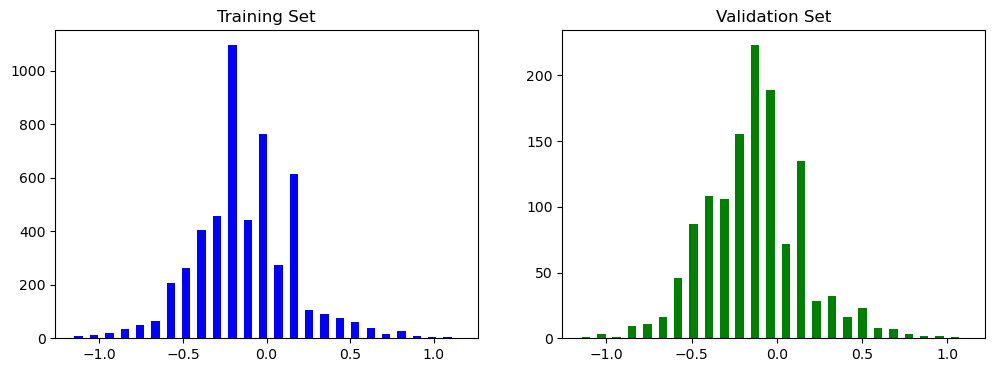

In [15]:
fig, axes = plt.subplots(1,2,figsize= (12,4))
axes[0].hist(y_train, bins= num_bins, width= 0.05, color=  'blue')
axes[0].set_title('Training Set')
axes[1].hist(y_valid, bins= num_bins, width= 0.05, color= 'green')
axes[1].set_title('Validation Set')

## Data Augmentation

In [16]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image
    
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

Text(0.5, 1.0, 'Zoomed Image')

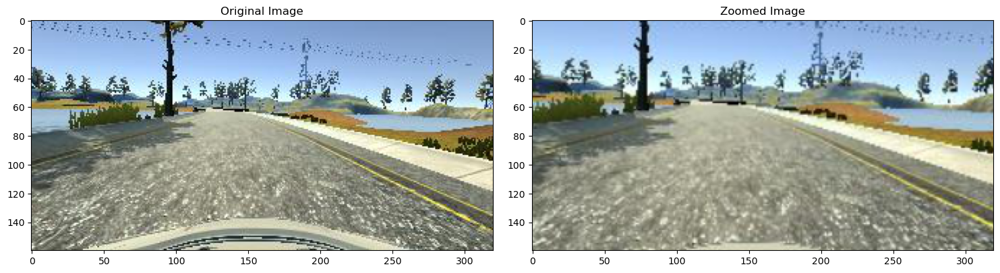

In [17]:
fig, axs= plt.subplots(1,2,figsize= (15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

In [18]:
def pan(image):
    pan= iaa.Affine(translate_percent={"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
    image =pan.augment_image(image)
    return image

Text(0.5, 1.0, 'Panned Image')

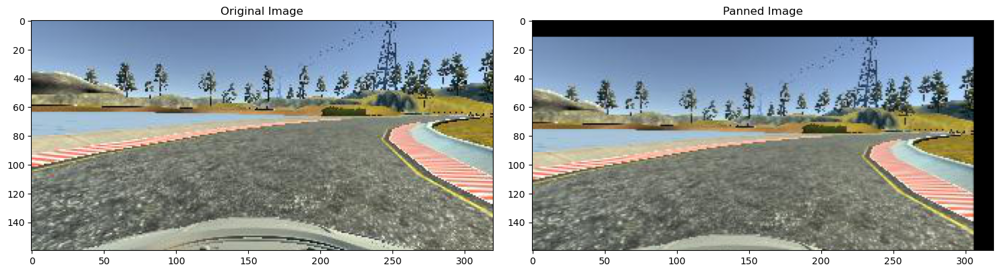

In [19]:
image = image_paths[random.randint(0, 1000)]
original_image= mpimg.imread(image)
panned_image = pan(original_image)

fig, axs= plt.subplots(1,2,figsize= (15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness Altered Image')

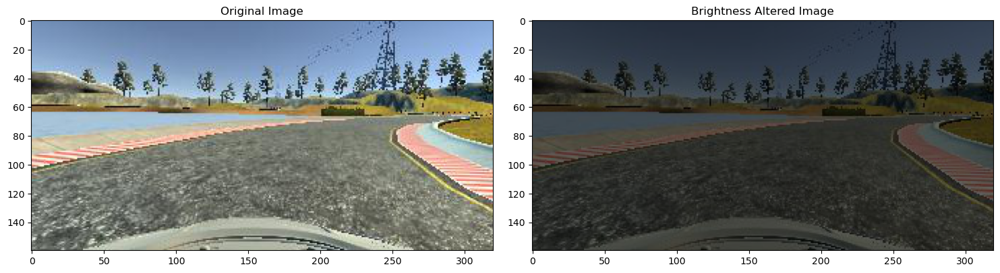

In [20]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image= image_paths[random.randint(0, 1000)]
original_image= mpimg.imread(image)
brightness_altered_image = img_random_brightness (original_image)

fig, axs= plt.subplots(1,2,figsize= (15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness Altered Image')

Text(0.5, 1.0, 'Flipped Image- Steering Angle: 0.5213937')

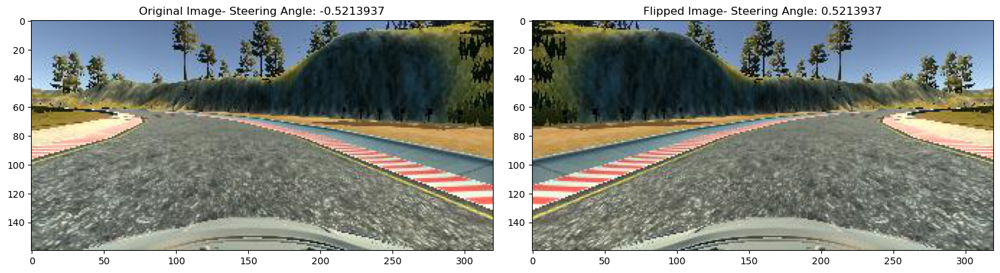

In [21]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image= mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs= plt.subplots(1,2,figsize= (15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image- ' + 'Steering Angle: '+ str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image- '+ 'Steering Angle: ' + str(flipped_steering_angle))

In [22]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand()<0.5:
        image= zoom(image)
    if np.random.rand()< 0.5:
        image= img_random_brightness(image)
    if np.random.rand()<0.5:
        image, steering_angle = img_random_flip(image, steering_angle)
    return image, steering_angle

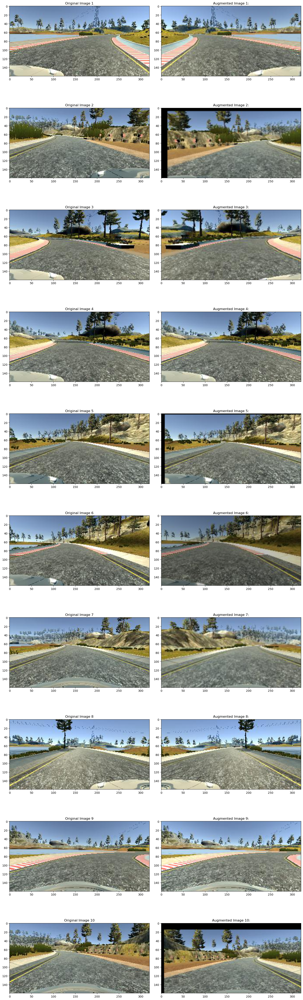

In [23]:

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

# Assuming the `random_augment` function and required transformations are already defined
# `image_paths` and `steerings` are your dataset of images and their corresponding steering angles

# ncol = 2
# nrow = 10

# fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
# fig.tight_layout()

# for i in range(nrow):
#     # Randomly select an image and its corresponding steering angle
#     randnum = random.randint(0, len(image_paths) - 1)
#     random_image_path = image_paths[randnum]
#     random_steering = steerings[randnum]

#     # Load the original image
#     original_image = mpimg.imread(random_image_path)

#     # Apply random augmentation
#     augmented_image, augmented_steering = random_augment(random_image_path, random_steering)

#     # Display the original image
#     axs[i][0].imshow(original_image)
#     axs[i][0].set_title(f"Original Image {i+1}")

#     # Display the augmented image
#     axs[i][1].imshow(augmented_image)
#     axs[i][1].set_title(f"Augmented Image {i+1}")

# plt.show()
ncol = 2  # One column for original, one for augmented image
nrow = 10  # 10 rows for 10 pairs of images

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(nrow):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image_path = image_paths[randnum]
    random_steering = steerings[randnum]

    # Load the original image
    original_image = mpimg.imread(random_image_path)

    # Apply random augmentations and get the list of applied augmentations
    augmented_image, steering= random_augment(random_image_path, random_steering)

    # Display the original image in the first column
    axs[i][0].imshow(original_image)
    axs[i][0].set_title(f"Original Image {i+1}")

    # Display the augmented image in the second column, with augmentation info
    axs[i][1].imshow(augmented_image)
    # augment_text = " + ".join(applied_augmentations) if applied_augmentations else "No Augmentation"
    axs[i][1].set_title(f"Augmented Image {i+1}:")

# Show the plot
plt.show()


## Image Preprocessing Steps

In [24]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV) # conversion from RBG to YUV depicting the luminance and chrominance
    img = cv2.GaussianBlur(img, (3,3),0) # gaussian blur to smoothen the image and reduce the noise
    img = cv2.resize(img, (200, 66)) # standardising the image size for easy application of CNN
    img= img/255 # normalizing the image pixel for reducing the biasness
    return img

Text(0.5, 1.0, 'Preprocessed Iamge')

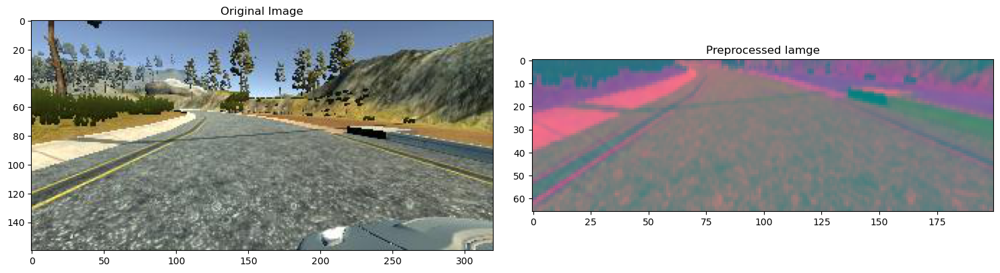

In [25]:
image = image_paths[200]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1,2, figsize= (15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Iamge')

In [26]:
!nvidia-smi

Tue Nov 19 01:22:08 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 556.13                 Driver Version: 556.13         CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1650      WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   47C    P8              2W /   50W |       0MiB /   4096MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Batch Generation for easy modeling

In [33]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

    while True:
        batch_img = []
        batch_steering = []

        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths)-1)
            
            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

            else:
                im = mpimg.imread(image_paths[random_index])
                steering =steering_ang[random_index]

            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
          

        yield (np.asarray(batch_img), np.asarray(batch_steering))

In [28]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

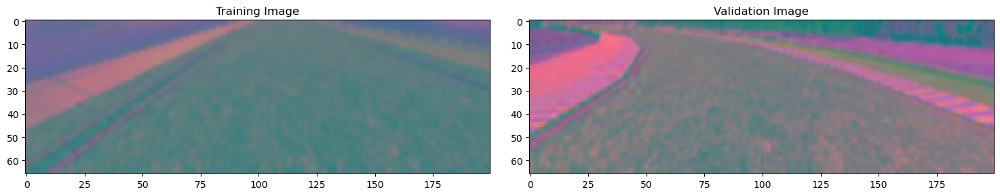

In [29]:
fig, axs = plt.subplots(1,2,figsize =( 15,10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [30]:
def nvidia_model():
      model= Sequential()
      model.add(Conv2D(24,(5,5), strides= (2,2), input_shape= (66,200,3), activation= 'elu'))
      model.add(Conv2D(36,(5,5), strides= (2,2), activation= 'elu'))
      model.add(Conv2D(48,(5,5), strides= (2,2), activation= 'elu'))
      model.add(Conv2D(64,(5,5), activation= 'elu'))
      
      model.add(Flatten())
      model.add(Dense(100, activation= 'elu'))
      #model.add(Dropout(0.5))
      
      model.add(Dense(50, activation= 'elu'))
      #model.add(Dropout(0.5))
      
      model.add(Dense(10, activation= 'elu'))
      #model.add(Dropout(0.5))
      
      model.add(Dense(1))
      optimizer = tf.keras.optimizers.Adam(learning_rate=  1e-3)
      model.compile(loss='mse', optimizer= optimizer)
      return model

In [31]:
model= nvidia_model()
print(model.summary())

c:\Users\anura\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 31, 98, 24)     │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 47, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 5, 22, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 1, 18, 64)      │        76,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │       115,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 264,443 (1.01 MB)

 Trainable params: 264,443 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

None


In [32]:
history = model.fit(batch_generator(X_train, y_train, 100,1 ), steps_per_epoch= 300, epochs=15, validation_data= batch_generator(X_valid, y_valid, 100, 0), validation_steps= 200, verbose=1, shuffle= 1)

Epoch 1/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 117s 379ms/step - loss: 0.2890 - val_loss: 0.0913
Epoch 2/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 112s 374ms/step - loss: 0.0820 - val_loss: 0.0549
Epoch 3/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 116s 388ms/step - loss: 0.0714 - val_loss: 0.0464
Epoch 4/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 103s 344ms/step - loss: 0.0619 - val_loss: 0.0477
Epoch 5/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 105s 350ms/step - loss: 0.0591 - val_loss: 0.0451
Epoch 6/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 103s 345ms/step - loss: 0.0553 - val_loss: 0.0421
Epoch 7/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 103s 343ms/step - loss: 0.0524 - val_loss: 0.0438
Epoch 8/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 104s 347ms/step - loss: 0.0516 - val_loss: 0.0445
Epoch 9/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 103s 345ms/step - loss: 0.0489 - val_loss: 0.0430
Epoch 10/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 102s 341ms/step - loss: 0.0488 - val_loss: 0.0457
Epoch 11/15
300/300 ━━━━━━━━━━━━━━━━━━━━ 104s 346ms/step - loss: 0.0473 - val_loss: 0.0407
Epoch 12

Text(0.5, 0, 'Epoch')

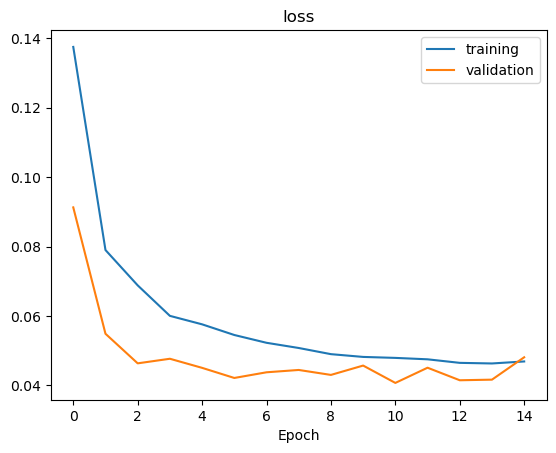

In [34]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training','validation'])
plt.title('loss')
plt.xlabel('Epoch')

In [35]:
model.save('Final_Model_2.h5')